# Import libraries

In [10]:
#!pip install plotly-express

In [11]:
#!pip install -U dash

In [12]:
#!pip install Flask

In [13]:
#!pip install psycopg2

In [14]:
#!pip install googlemaps

In [1]:
import os
import psycopg2
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import dash
import flask
import dash_core_components as dcc
import dash_html_components as html
from dash.dependencies import Input, Output
from dash.dash_table.Format import Group
import dash_table
import plotly.express as px
import pandas as pd
import warnings
warnings.filterwarnings("ignore")

C:\Users\Vikram\AppData\Local\Temp\ipykernel_7092\3743950694.py:8: UserWarning: 
The dash_core_components package is deprecated. Please replace
`import dash_core_components as dcc` with `from dash import dcc`
  import dash_core_components as dcc
C:\Users\Vikram\AppData\Local\Temp\ipykernel_7092\3743950694.py:9: UserWarning: 
The dash_html_components package is deprecated. Please replace
`import dash_html_components as html` with `from dash import html`
  import dash_html_components as html
C:\Users\Vikram\AppData\Local\Temp\ipykernel_7092\3743950694.py:12: UserWarning: 
The dash_table package is deprecated. Please replace
`import dash_table` with `from dash import dash_table`

Also, if you're using any of the table format helpers (e.g. Group), replace 
`from dash_table.Format import Group` with 
`from dash.dash_table.Format import Group`
  import dash_table


# Database connection

In [2]:
# Connect the database
conn = psycopg2.connect(
        host="localhost",
        port = '5432',
        database="FinalShips",
        user='postgres',
        password= 'password')

# create a cursor 
#cur = conn.cursor() 

#cur.execute( 
    #'''SELECT * FROM ships LIMIT 5''') 

#data = cur.fetchall()
#data

# Fetch data into a dataframe using hardcode queries
#df = pd.read_sql_query('SELECT type, COUNT(mmsi) FROM ships GROUP BY type;',conn)
#df

# Queries

Main Query

Reading from file

In [3]:
lat_lon_df = pd.read_csv('lat_lon_mmsi.csv')

In [5]:
query1 = """
            SELECT t1.mmsi, t1.time, t1.lat, t1.lon
            FROM type1_2_3 t1
            WHERE t1.mmsi IN %s
            AND t1.mmsi IS NOT NULL
            AND t1.lon IS NOT NULL
            AND t1.lat IS NOT NULL
         """
location_df = pd.read_sql_query(query1, conn, params=(tuple(lat_lon_df["mmsi"]),))

In [31]:
Lats = location_df['lat'].head(500)
Lons = location_df['lon'].head(500)
Mmsi = location_df['mmsi'].head(500)
Time = location_df['time'].head(500)

In [37]:
import folium
from IPython.display import display

def show_map_in_with_markers(lats, lons, mmsi, time, zoom=10, map_type='Stamen Toner'):

    if mmsi.empty:
        print("No ships with matching MMSI found in September")
    else:
        map = folium.Map(location=[lats[0], lons[0]], zoom_start=zoom, map_type=map_type)
        markers = []
        for i in range(len(lats)):
            custom_icon = folium.features.CustomIcon('ss.png', icon_size=(25, 25))
            marker = folium.Marker([lats[i], lons[i]], popup=f'MMSI: {mmsi[i]}, Time: {time[i]}', icon=custom_icon)
            markers.append(marker)
        for marker in markers:
            map.add_child(marker)
        display(map)



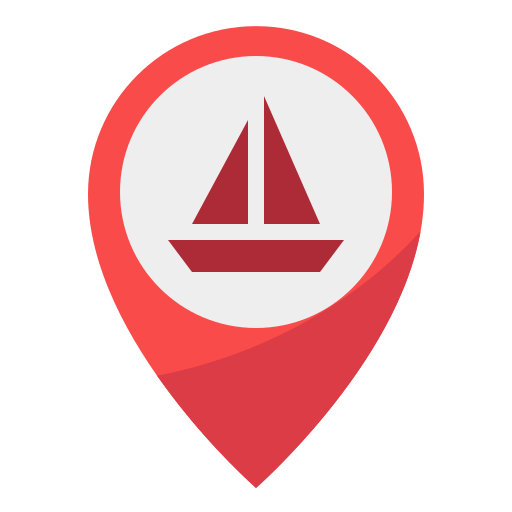
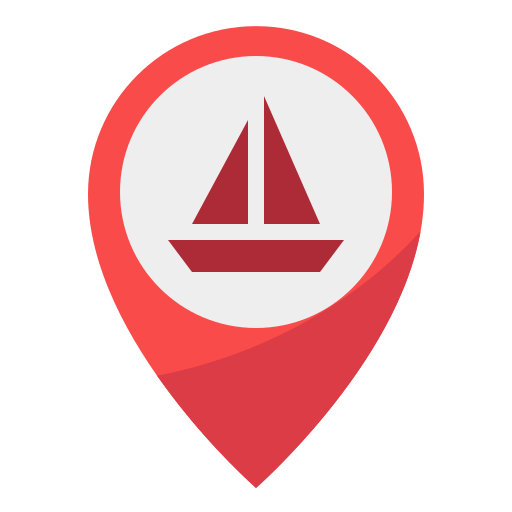
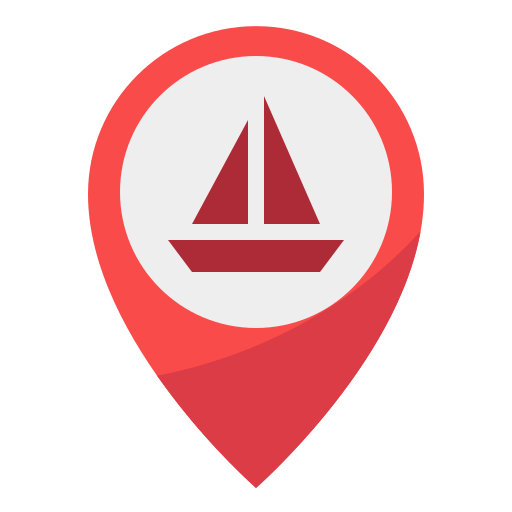
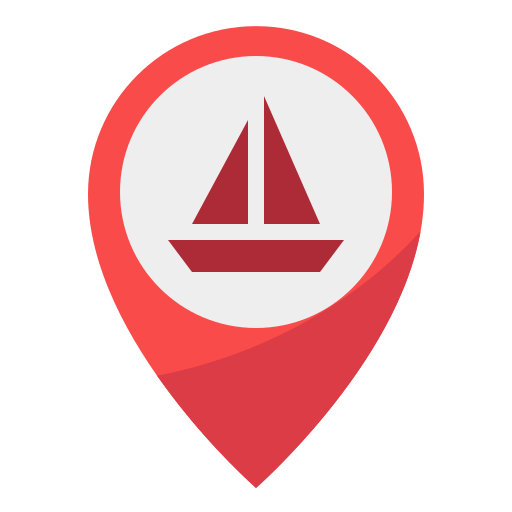
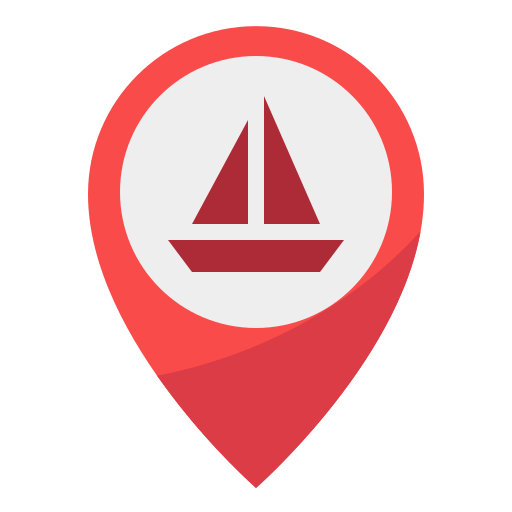
...
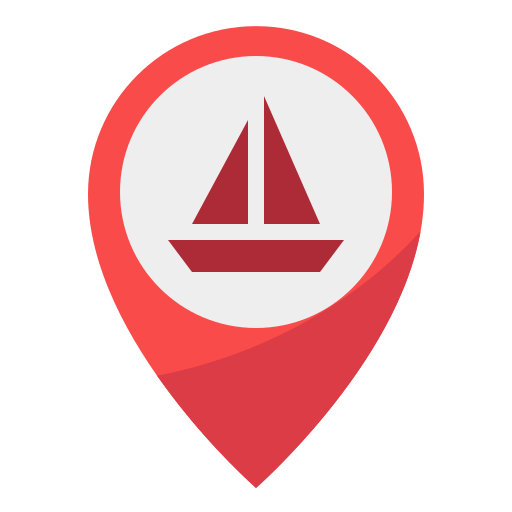
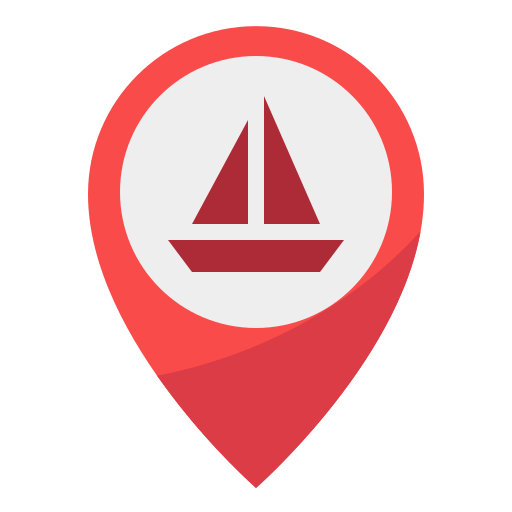
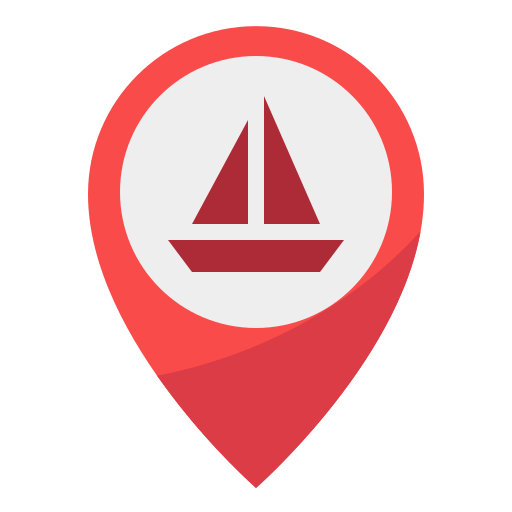
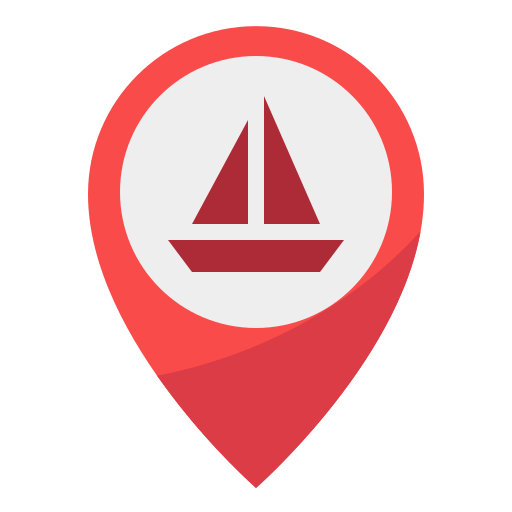
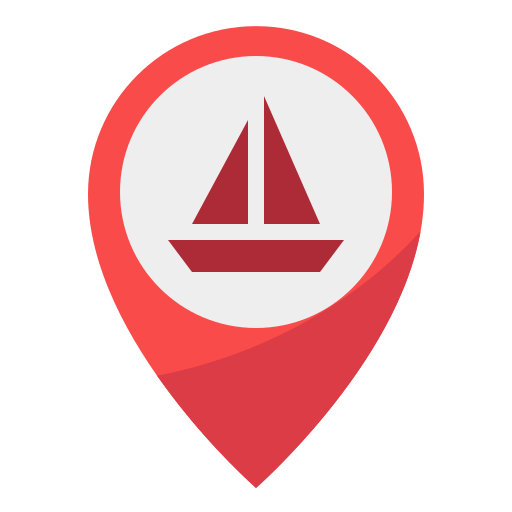

In [38]:
show_map_in_with_markers(Lats,Lons,Mmsi,Time, zoom=10, map_type='Stamen Toner')

In [15]:
import folium

# Define the latitude and longitude for the ports
ports = [
    {"name": "Tanjor Pagar", "lat": 1.2607, "lon": 103.8480},
    {"name": "Keppel Harbour", "lat": 1.2612, "lon": 103.8225},
    {"name": "Keppel Terminal", "lat": 1.2690, "lon": 103.8380},
    {"name": "Marina at Keppel Bay", "lat": 1.2664, "lon": 103.8347},
    {"name": "Brani", "lat": 1.2664, "lon": 103.8347},
    {"name": "Pasir Panjang Terminal 1", "lat": 1.2839, "lon": 103.7652},
    {"name": "Pasir Panjang Terminal 2", "lat": 1.2644, "lon": 103.7800},
    {"name": "Pasir Panjang Terminal 3", "lat": 1.2749, "lon": 103.7848},
    {"name": "Pasir Panjang Terminal 4", "lat": 1.2754, "lon": 103.7896},
    {"name": "Pasir Panjang Terminal 5", "lat": 1.2759, "lon": 103.7944},
    {"name": "Pasir Panjang Terminal 6", "lat": 1.2764, "lon": 103.7992},
    {"name": "Tuas Port", "lat": 1.2443, "lon": 103.6119},
    {"name": "Jurong Port", "lat": 1.3098, "lon": 103.7172}
]

# Create a Folium map centered around Singapore
m = folium.Map(location=[1.290270, 103.851959], zoom_start=12)

# Plot a square for each port with the specified latitude and longitude ranges
for port in ports:
    folium.Polygon(
        locations=[
            (port["lat"] + 0.01, port["lon"] - 0.01),
            (port["lat"] - 0.01, port["lon"] - 0.01),
            (port["lat"] - 0.01, port["lon"] + 0.01),
            (port["lat"] + 0.01, port["lon"] + 0.01),
        ],
        color='blue',
        fill=True,
        fill_opacity=0.1,
    ).add_to(m)
    folium.Marker([port["lat"], port["lon"]], tooltip=port["name"]).add_to(m)

# Display the map
display(m)


# App development

In [21]:
lat_lon_df = pd.read_csv('country20.csv')
country_name_list = lat_lon_df['country_name'].tolist()

In [28]:
import dash
import dash_core_components as dcc
import dash_html_components as html
from dash.dependencies import Input, Output
import folium
import pandas as pd
import tempfile
from datetime import datetime


app = dash.Dash(__name__)

ShipLimit = 20
country_name = 'All'
Shour = 12
icSize = 40  # Default icon size

# Define a function to create and update the map
def create_map(lats1, lons1, mmsi1, country1,time1):
    global icSize

    if ShipLimit > 50:
        icSize = 25
    elif ShipLimit > 100:
        icSize = 15

    map = folium.Map(location=[lats1[0], lons1[0]], zoom_start=10, tiles='OpenStreetMap')
    markers = []

    for i in range(len(lats1)):
        custom_icon = folium.CustomIcon('ss.png', icon_size=(icSize, icSize))
        marker = folium.Marker([lats1[i], lons1[i]], popup=f'mmsi: {mmsi1[i]},time: {time1[i]}', icon=custom_icon)
        markers.append(marker)

    for marker in markers:
        map.add_child(marker)

    # Save the map as an HTML file
    temp_dir = tempfile.mkdtemp()
    map_file_path = f"{temp_dir}/ship_map.html"
    map.save(map_file_path)

    return map_file_path

app.layout = html.Div([
    html.H1("Interactive Ship Map", style={'font-size': '40px'}),
    html.H3("Select Date"),
    dcc.DatePickerSingle(
        id='date-picker',
        display_format='YYYY-MM-DD',
        date=datetime(2023, 9, 1)
    ),
    html.H3("Select the number of ships you would like to see:"),
    dcc.Slider(
        id='ship-limit-slider',
        min=20,
        max=200,
        step=10,
        value=20,
        marks={i: str(i) for i in range(20, 201, 10)}
    ),
    html.H3("Select the Hour of the day"),
    dcc.Slider(
    id='hour-slider',
    min=1,
    max=24,
    step=1,
    value=12,
    marks={i: str(i) for i in range(1, 25)}
    ),
    html.H3("Select Country"),
    dcc.Dropdown(
        id='country-dropdown',
        options=[{'label': country, 'value': country} for country in country_name_list],
        value='All'
    ),
    html.Iframe(
        id='ship-map',
        width='100%',
        height='600',
        style={'margin': '20px', 'border': '1px solid #ccc'}
    )
])

@app.callback(
    Output('ship-map', 'srcDoc'),
    [Input('date-picker', 'date'), Input('ship-limit-slider', 'value'), Input('hour-slider', 'value'), Input('country-dropdown', 'value')]
)
def update_map(selected_date, ship_limit, Shour,selected_country):
    global ShipLimit
    ShipLimit = ship_limit
    country_name = selected_country

    if country_name == "All":
        query1 = """
            SELECT t1.mmsi, t1.time, t1.lat, t1.lon
            FROM type1_2_3 t1
            WHERE t1.mmsi IN (SELECT DISTINCT mmsi FROM type5)
            AND DATE(t1.time) = %s
            AND EXTRACT(HOUR FROM t1.time) = %s
            AND t1.mmsi IS NOT NULL
            AND t1.lon IS NOT NULL
            AND t1.lat IS NOT NULL
            LIMIT %s;
        """
        location_df = pd.read_sql_query(query1, conn, params=(selected_date, Shour, ShipLimit))
        lats1 = location_df['lat'].tolist()
        lons1 = location_df['lon'].tolist()
        mmsi1 = location_df['mmsi'].tolist()
        time1 = location_df['time'].tolist()
        country1 = []
    else:
        query1 = """
            SELECT t1.mmsi, t1.time, t1.lat, t1.lon, c.country_name
            FROM type1_2_3 t1
            LEFT JOIN country_code c ON t1.mmsi / 1000000 = c.mid
            WHERE t1.mmsi IN (SELECT DISTINCT mmsi FROM type5)
            AND DATE(t1.time) = %s
            AND c.country_name = %s
            AND EXTRACT(HOUR FROM t1.time) = %s
            AND t1.mmsi IS NOT NULL
            AND t1.lon IS NOT NULL
            AND t1.lat IS NOT NULL
            LIMIT %s;
        """
        location_df = pd.read_sql_query(query1, conn, params=(selected_date, country_name, Shour, ShipLimit))
        lats1 = location_df['lat'].tolist()
        lons1 = location_df['lon'].tolist()
        mmsi1 = location_df['mmsi'].tolist()
        time1 = location_df['time'].tolist()
        country1 = location_df['country_name'].tolist()

    
    #query1 = "SELECT mmsi, lon, lat FROM ships WHERE DATE(time) = %s AND EXTRACT(HOUR FROM time) = %s AND mmsi IS NOT NULL AND lon IS NOT NULL AND lat IS NOT NULL LIMIT %s;"
    

    

    map_file_path = create_map(lats1, lons1, mmsi1, country1, time1)
    with open(map_file_path, 'r') as map_file:
        map_html = map_file.read()

    return map_html

if __name__ == '__main__':
    app.run(jupyter_mode="external")



Dash app running on http://127.0.0.1:8050/
